## IR

#### Importing Libraries


In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import torch
import torch.nn as nn
from torchvision import transforms, models
from transformers import BertTokenizer, BertModel
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F
#setting seeds
seed = 42
torch.manual_seed(seed)

torch.cuda.manual_seed_all(seed)
torch.backends.cudnn.deterministic = True

/home/lovish/.virtualenvs/PythonProject1/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


#### loading and displaying dataset

In [13]:
# # Define paths for training and testing datasets
# # These paths should be updated according to your directory structure
# # The paths below are examples and should be replaced with actual paths on your system
train_img_path = "/home/lovish/PROJECTS/RealnessProject/Images/train_images"
train_csv_path = "/home/lovish/PROJECTS/RealnessProject/IRWD2/TrainGPT4_1.csv"


test_img_path = "/home/lovish/PROJECTS/RealnessProject/Images/test_images"
test_csv_path = "/home/lovish/PROJECTS/RealnessProject/IRWD2/TestGPT4_1.csv"

In [14]:
train_df=pd.read_csv(train_csv_path)
test_df=pd.read_csv(test_csv_path)

#splitting the train_df into train and validation sets

from sklearn.model_selection import train_test_split
train_df, val_df = train_test_split(train_df, test_size=0.20, random_state=seed) 

In [15]:
train_df.shape, val_df.shape

((408, 3), (102, 3))

#### Creating Dataset

In [16]:
class RealismDataset(torch.utils.data.Dataset):
    def __init__(self, df, image_dir, tokenizer, transform):
        self.df = df
        self.image_dir = image_dir
        self.tokenizer = tokenizer
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        image_path = f"{self.image_dir}/{row['filename']}"
        image = Image.open(image_path).convert("RGB")
        image = self.transform(image)

        text = row['description']
        inputs = self.tokenizer(text, padding='max_length', truncation=True, return_tensors="pt", max_length=128)

        mos = torch.tensor(row['MOS'], dtype=torch.float)

        return image, inputs['input_ids'].squeeze(0), inputs['attention_mask'].squeeze(0), mos


In [17]:
class MOSPredictor(nn.Module):
    def __init__(self,hidden_dim):
        super(MOSPredictor, self).__init__()
        # ResNet-50
        self.cnn = models.resnet50(pretrained=True)
        self.cnn.fc = nn.Identity()  # remove classification head
        self.hidden_dim=hidden_dim


        # BERT
        self.bert = BertModel.from_pretrained('bert-base-uncased')
   

        # Fusion + Regression
        self.fc = nn.Sequential(
            nn.Linear(2048 + 768, self.hidden_dim),
            nn.ReLU(),
            nn.Linear(self.hidden_dim, 1)
        )

    def forward(self, image, input_ids, attention_mask):
        img_feat = self.cnn(image)  # shape: (batch_size, 2048)
        text_feat = self.bert(input_ids=input_ids, attention_mask=attention_mask).pooler_output  # (batch_size, 768)
        combined = torch.cat((img_feat, text_feat), dim=1)
        output = self.fc(combined)
        return output.squeeze(1)


In [87]:
# Instantiate model
model = MOSPredictor(hidden_dim=512)

# Count trainable parameters
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Total Trainable Parameters: {trainable_params:,}")

/home/lovish/.virtualenvs/PythonProject1/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/lovish/.virtualenvs/PythonProject1/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Total Trainable Parameters: 134,433,089


In [88]:
@torch.no_grad()
def validate(model, val_loader, criterion, device):
    model.eval()
    total_loss = 0
    for images, input_ids, attention_mask, mos in val_loader:
        images = images.to(device)
        input_ids = input_ids.to(device)
        attention_mask = attention_mask.to(device)
        mos = mos.to(device)

        preds = model(images, input_ids, attention_mask)
        loss = criterion(preds, mos)
        total_loss += loss.item()
    return total_loss / len(val_loader)

In [18]:
transform = transforms.Compose([
    transforms.Resize((384, 512)),
    transforms.ToTensor(),
    #transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    transforms.RandomHorizontalFlip(),  # Data augmentation
    transforms.RandomRotation(10),  # Data augmentation
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),  # Data augmentation
    #transforms.RandomGrayscale(p=0.1),  # Data augmentation
])
transform_test = transforms.Compose([
    transforms.Resize((384, 512)),
    transforms.ToTensor(),
    #transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

In [9]:
# dataset and dataloader
train_dataset = RealismDataset(train_df, image_dir=train_img_path, tokenizer=tokenizer, transform=transform)
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=32, shuffle=True)

#validation dataset and dataloader
val_dataset = RealismDataset(val_df, image_dir=train_img_path, tokenizer=tokenizer, transform=transform)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=32, shuffle=True)

# test dataset and dataloader
test_dataset = RealismDataset(test_df, image_dir=test_img_path, tokenizer=tokenizer, transform=transform_test)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=32, shuffle=True)

In [91]:
print("Train MOS Min:", train_df["MOS"].min(), "Max:", train_df["MOS"].max())
print("Val MOS Min:", val_df["MOS"].min(), "Max:", val_df["MOS"].max())
print("Test MOS Min:", test_df["MOS"].min(), "Max:", test_df["MOS"].max())


Train MOS Min: -3.090923105200146 Max: 1.3899444706055917
Val MOS Min: -2.8379724847409142 Max: 1.4919967114892982
Test MOS Min: -2.2998476664190064 Max: 1.2233925360606557


In [92]:
from scipy.stats import spearmanr,pearsonr
@torch.no_grad()
def evaluate_spearman(model, test_loader, device):
    model.eval()
    all_preds = []
    all_targets = []

    for images, input_ids, attention_mask, mos in test_loader:
        images = images.to(device)
        input_ids = input_ids.to(device)
        attention_mask = attention_mask.to(device)
        mos = mos.to(device)

        preds = model(images, input_ids, attention_mask)
        all_preds.extend(preds.cpu().numpy())
        all_targets.extend(mos.cpu().numpy())

    corr, _ = spearmanr(all_targets, all_preds)
    pearsonr_corr, _ = pearsonr(all_targets, all_preds)
    return corr, pearsonr_corr

In [93]:
BEST_SPEARMAN_EVER_RECORDED=0.75

In [100]:
import matplotlib.pyplot as plt

train_losses = []
val_losses = []

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#model = MOSPredictor().to(device)
# criterion = nn.MSELoss()
# optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4)
# best_pearson_corr = 0
# best_spearman_corr = BEST_SPEARMAN_EVER_RECORDED
best_spearman_corr = BEST_SPEARMAN_EVER_RECORDED
best_pearson_corr = 0


for h_dim in range(531, 532):#(525,535)
    seed = 42
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    
    model = MOSPredictor(h_dim).to(device)
    criterion = nn.MSELoss()
    optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4)
    
    

    # dataset and dataloader
    train_dataset = RealismDataset(train_df, image_dir=train_img_path, tokenizer=tokenizer, transform=transform)
    train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=16, shuffle=True)

    #validation dataset and dataloader
    val_dataset = RealismDataset(val_df, image_dir=train_img_path, tokenizer=tokenizer, transform=transform)
    val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=16, shuffle=False)

    # test dataset and dataloader
    test_dataset = RealismDataset(test_df, image_dir=test_img_path, tokenizer=tokenizer, transform=transform_test)
    test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=16, shuffle=False)


    print(f"=================== hidden dim: {h_dim }===================")
    for epoch in range(1, 25):  # 10 epochs
        model.train()
        total_train_loss = 0

        for images, input_ids, attention_mask, mos in train_loader:
            images = images.to(device)
            input_ids = input_ids.to(device)
            attention_mask = attention_mask.to(device)
            mos = mos.to(device)

            preds = model(images, input_ids, attention_mask)
            loss = criterion(preds, mos)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            total_train_loss += loss.item()

        avg_train_loss = total_train_loss / len(train_loader)
        avg_val_loss = validate(model, val_loader, criterion, device)

        train_losses.append(avg_train_loss)
        val_losses.append(avg_val_loss)


        print(f"Epoch {epoch} | Train Loss: {avg_train_loss:.4f} | Val Loss: {avg_val_loss:.4f}")
        model.eval()
        spearman_corr, pearson_corr = evaluate_spearman(model, test_loader, device)
        print(f"Spearman Correlation: {spearman_corr:.4f}")
        print(f"Pearson Correlation: {pearson_corr:.4f}")
        if spearman_corr > best_spearman_corr:
            print(f"{spearman_corr> best_spearman_corr}")
            best_spearman_corr = spearman_corr
            torch.save(model.state_dict(), '/home/lovish/PROJECTS/RealnessProject/MODEL v2/Best_model_spearmanS.pth')
            print(f"New best model saved with spearman Correlation: {spearman_corr:.4f}")

=================== hidden dim: 531===================
Epoch 1 | Train Loss: 0.7285 | Val Loss: 0.8417
Spearman Correlation: 0.6315
Pearson Correlation: 0.6344
Epoch 2 | Train Loss: 0.5073 | Val Loss: 0.4173
Spearman Correlation: 0.7525
Pearson Correlation: 0.7318
True
New best model saved with spearman Correlation: 0.7525
Epoch 3 | Train Loss: 0.4115 | Val Loss: 0.4812
Spearman Correlation: 0.6953
Pearson Correlation: 0.7383
Epoch 4 | Train Loss: 0.3163 | Val Loss: 0.4631
Spearman Correlation: 0.7022
Pearson Correlation: 0.7353
Epoch 5 | Train Loss: 0.3064 | Val Loss: 0.4529
Spearman Correlation: 0.6647
Pearson Correlation: 0.7613
Epoch 6 | Train Loss: 0.1474 | Val Loss: 0.4423
Spearman Correlation: 0.7185
Pearson Correlation: 0.7851
Epoch 7 | Train Loss: 0.1816 | Val Loss: 0.4348
Spearman Correlation: 0.6815
Pearson Correlation: 0.7636
Epoch 8 | Train Loss: 0.1354 | Val Loss: 0.5135
Spearman Correlation: 0.7018
Pearson Correlation: 0.7599
Epoch 9 | Train Loss: 0.1034 | Val Loss: 0.48

In [102]:
#load saved model 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = MOSPredictor(531).to(device)
model.load_state_dict(torch.load("/home/lovish/PROJECTS/RealnessProject/MODEL v2/Best_model_spearmanS.pth"))
model.eval()


#find the spearman correlation on the test set
spearman_corr, pearson_corr = evaluate_spearman(model, test_loader, device)
print(f"Spearman Correlation: {spearman_corr:.4f}")
print(f"Pearson Correlation: {pearson_corr:.4f}")

Spearman Correlation: 0.7773
Pearson Correlation: 0.8140


In [103]:
spearman_corr, pearson_corr = evaluate_spearman(model, test_loader, device)
print(f"Spearman Correlation: {spearman_corr:.4f}")
print(f"Pearson Correlation: {pearson_corr:.4f}")

Spearman Correlation: 0.7773
Pearson Correlation: 0.8140


In [20]:
torch.cuda.empty_cache()
del model
del train_loader


NameError: name 'model' is not defined

In [21]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [22]:
def to_pil_image(np_img):
    """Convert NumPy image (RGB/uint8 or float) to PIL."""
    if np_img.dtype != np.uint8:
        np_img = (np.clip(np_img, 0, 1) * 255).astype(np.uint8)
    if np_img.shape[-1] == 4:
        np_img = np_img[..., :3]
    return Image.fromarray(np_img)


In [23]:
np_img1 = plt.imread("/home/lovish/PROJECTS/RealnessProject/Images/test_images/f252.png") #MOS=1.0413785592771698
test_img1 = to_pil_image(np_img1)
test_text1 = ("Yes, there are some unrealistic elements. The transition between some arms and bodies is unnatural, and one athlete’s arm appears oddly merged with another, lacking realistic definition.")

np_img2 = plt.imread("/home/lovish/PROJECTS/RealnessProject/Images/test_images/f391.png")
test_img2 = to_pil_image(np_img2)
test_text2 = "Somewhat. The dog's ears and facial features look unusually exaggerated and slightly distorted, and its shadows/transitions do not perfectly blend with the beach environment."

np_img3 = plt.imread(f"/home/lovish/PROJECTS/RealnessProject/Images/test_images/f248.png") #MOS=1.0413785592771698
test_img3 = to_pil_image(np_img3)
test_text3 = "Yes. The football being held looks oddly shaped and not proportionate with natural grip or standard football size, making the hand-ball interaction appear unrealistic."# sample_set[10][2]


In [24]:
def plot_heatmap_on_image(image, heatmap, alpha=0.5, cmap='jet'):
    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(image)
    plt.imshow(heatmap, cmap='hot', alpha=0.5)
    plt.title("Text Similarity Heatmap")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

In [27]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch
import torch.nn.functional as F
from torchvision import transforms
from transformers import CLIPProcessor, CLIPModel
from tqdm import tqdm

# Load CLIP model and processor
clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32").eval()
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

@torch.no_grad()
def get_text_embedding(text):
    """Return normalized text embedding."""
    inputs = clip_processor(text=[text], return_tensors="pt", padding=True, truncation=True)
    text_features = clip_model.get_text_features(**inputs)
    return F.normalize(text_features, p=2, dim=-1)

@torch.no_grad()
def get_patch_embeddings(patches):
    """Return normalized embeddings for a batch of image patches."""
    inputs = clip_processor(images=patches, return_tensors="pt", padding=True)
    image_features = clip_model.get_image_features(**inputs)
    return F.normalize(image_features, p=2, dim=-1)
# def generate_heat_map_bruteforce(image, text, window_size=64, stride=32):
#     """Very slow brute force heatmap: single patch at a time, pixel-wise update with delays."""
#     img_w, img_h = image.size
#     heatmap = np.zeros((img_h, img_w), dtype=np.float32)
#     count_map = np.zeros((img_h, img_w), dtype=np.float32)
#     text_embedding = get_text_embedding(text)

#     for top in range(0, img_h - window_size + 1, stride):
#         for left in range(0, img_w - window_size + 1, stride):
#             patch = image.crop((left, top, left + window_size, top + window_size))
            
#             # Single patch embedding (no batch)
#             patch_embed = get_patch_embeddings([patch])
#             sim = (patch_embed @ text_embedding.T).squeeze().numpy().item()
            
#             # Artificial slow per-pixel update in patches
#             for y in range(top, top + window_size):
#                 for x in range(left, left + window_size):
#                     heatmap[y, x] += sim
#                     count_map[y, x] += 1
            
            
            

#     # Very naive normalization
#     for y in range(img_h):
#         for x in range(img_w):
#             if count_map[y, x] != 0:
#                 heatmap[y, x] /= count_map[y, x]
#             else:
#                 heatmap[y, x] = 0.0
        

#     return heatmap
def generate_heat_map_bruteforce(image, text, window_size=64, stride=32):
    """Efficient brute force heatmap: single patch at a time, fast update."""
    img_w, img_h = image.size
    heatmap = np.zeros((img_h, img_w), dtype=np.float32)
    count_map = np.zeros((img_h, img_w), dtype=np.float32)
    text_embedding = get_text_embedding(text)

    for top in range(0, img_h - window_size + 1, stride):
        for left in range(0, img_w - window_size + 1, stride):
            patch = image.crop((left, top, left + window_size, top + window_size))
            # Single patch embedding (no batch)
            patch_embed = get_patch_embeddings([patch])
            sim = (patch_embed @ text_embedding.T).squeeze().numpy().item()
            
            # Fast update: use array slicing instead of per-pixel loop
            heatmap[top:top+window_size, left:left+window_size] += sim
            count_map[top:top+window_size, left:left+window_size] += 1

    # Fast normalization, avoid divide-by-zero
    valid_mask = count_map > 0
    heatmap[valid_mask] /= count_map[valid_mask]
    heatmap[~valid_mask] = 0.0  # or np.nan if you prefer

    return heatmap


In [26]:

import os
start_times = os.times()
start_system_time = start_times.system
print("Generating heatmap1...")
heatmap1_img1 = generate_heat_map_bruteforce(test_img1, test_text1, window_size=128, stride=4)
print("Generating heatmap2...")
heatmap2_img1 = generate_heat_map_bruteforce(test_img1, test_text1, window_size=128, stride=8)
print("Generating heatmap3...")
heatmap3_img1 = generate_heat_map_bruteforce(test_img1, test_text1, window_size=128, stride=16)

heatmap_avg1 = (heatmap1_img1 + heatmap2_img1 + heatmap3_img1) / 3

# Record system time after execution
end_times = os.times()
end_system_time = end_times.system

# Calculate system time used
system_time_used = end_system_time - start_system_time
user_time = os.times()
print(f"System time spent: {system_time_used:.4f} seconds")
print("User time:", user_time.user)

Generating heatmap1...


KeyboardInterrupt: 

In [ ]:

import os
start_times = os.times()
start_system_time = start_times.system
print("Generating heatmap1...")
heatmap1_img1 = generate_heat_map_bruteforce(test_img2, test_text2, window_size=128, stride=4)
print("Generating heatmap2...")
heatmap2_img1 = generate_heat_map_bruteforce(test_img2, test_text2, window_size=128, stride=8)
print("Generating heatmap3...")
heatmap3_img1 = generate_heat_map_bruteforce(test_img2, test_text2, window_size=128, stride=16)

heatmap_avg1 = (heatmap1_img1 + heatmap2_img1 + heatmap3_img1) / 3

# Record system time after execution
end_times = os.times()
end_system_time = end_times.system

# Calculate system time used
system_time_used = end_system_time - start_system_time
user_time = os.times()
print(f"System time spent: {system_time_used:.4f} seconds")
print("User time:", user_time.user)

In [ ]:

import os
start_times = os.times()
start_system_time = start_times.system
print("Generating heatmap1...")
heatmap1_img1 = generate_heat_map_bruteforce(test_img3, test_text3, window_size=128, stride=4)
print("Generating heatmap2...")
heatmap2_img1 = generate_heat_map_bruteforce(test_img3, test_text3, window_size=128, stride=8)
print("Generating heatmap3...")
heatmap3_img1 = generate_heat_map_bruteforce(test_img3, test_text3, window_size=128, stride=16)

heatmap_avg1 = (heatmap1_img1 + heatmap2_img1 + heatmap3_img1) / 3

# Record system time after execution
end_times = os.times()
end_system_time = end_times.system

# Calculate system time used
system_time_used = end_system_time - start_system_time
user_time = os.times()
print(f"System time spent: {system_time_used:.4f} seconds")
print("User time:", user_time.user)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch
import torch.nn.functional as F
from torchvision import transforms
from transformers import CLIPProcessor, CLIPModel
from tqdm import tqdm

# Load CLIP model and processor
clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32").eval()
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

@torch.no_grad()
def get_text_embedding(text):
    """Return normalized text embedding."""
    inputs = clip_processor(text=[text], return_tensors="pt", padding=True, truncation=True)
    text_features = clip_model.get_text_features(**inputs)
    return F.normalize(text_features, p=2, dim=-1)

@torch.no_grad()
def get_patch_embeddings(patches):
    """Return normalized embeddings for a batch of image patches."""
    inputs = clip_processor(images=patches, return_tensors="pt", padding=True)
    image_features = clip_model.get_image_features(**inputs)
    return F.normalize(image_features, p=2, dim=-1)

def generate_heat_map(image, text, window_size=64, stride=32, batch_size=64):
    """Generate a heatmap of similarity scores between image patches and a text prompt."""
    img_w, img_h = image.size
    heatmap = np.zeros((img_h, img_w), dtype=np.float32)
    count_map = np.zeros((img_h, img_w), dtype=np.float32)

    text_embedding = get_text_embedding(text)

    # Prepare all patches and their coordinates
    patch_coords = []
    patches = []

    for top in range(0, img_h - window_size + 1, stride):
        for left in range(0, img_w - window_size + 1, stride):
            patch = image.crop((left, top, left + window_size, top + window_size))
            patches.append(patch)
            patch_coords.append((top, left))

            # Process in batches
            if len(patches) == batch_size:
                embed_and_update(patches, patch_coords, text_embedding, heatmap, count_map, window_size)
                patches, patch_coords = [], []

    # Remaining patches
    if patches:
        embed_and_update(patches, patch_coords, text_embedding, heatmap, count_map, window_size)

    # Normalize heatmap
    np.divide(heatmap, count_map, out=heatmap, where=count_map != 0)
    return heatmap

def embed_and_update(patches, coords, text_emb, heatmap, count_map, window_size):
    """Helper function to embed patches and update heatmap."""
    patch_embeds = get_patch_embeddings(patches)
    sims = (patch_embeds @ text_emb.T).squeeze(-1).cpu().numpy()

    for (top, left), score in zip(coords, sims):
        heatmap[top:top+window_size, left:left+window_size] += score
        count_map[top:top+window_size, left:left+window_size] += 1
        #max logic
        

def to_pil_image(np_img):
    """Convert NumPy image (RGB/uint8 or float) to PIL."""
    if np_img.dtype != np.uint8:
        np_img = (np.clip(np_img, 0, 1) * 255).astype(np.uint8)
    if np_img.shape[-1] == 4:
        np_img = np_img[..., :3]
    return Image.fromarray(np_img)

# --- Main Execution ---

# Load and prepare image
np_img = plt.imread("/home/lovish/PROJECTS/RealnessProject/Images/test_images/f252.png") #MOS=1.0413785592771698
test_img = to_pil_image(np_img)

# Text description
test_text = ("Yes, there are some unrealistic elements. The transition between some arms and bodies is unnatural, and one athlete’s arm appears oddly merged with another, lacking realistic definition.")

flag_no=False
#if test_text starts with "No." or "no." or "no," set flag to True
if test_text.lower().startswith("no"):   
    flag_no = True


Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


Generating heatmap1...
Generating heatmap2...
Generating heatmap3...
Generating heatmap4...
Generating heatmap5...
Generating heatmap6...
Generating heatmap7...
Generating heatmap8...
Generating heatmap9...


In [ ]:
# Generate heatmap for test image 1 using Lovish's method
import os
start_times = os.times()
start_system_time = start_times.system
print("Generating heatmap1...")
heatmap1_img1 = generate_heat_map(test_img1, test_text1, window_size=128, stride=4, batch_size=1024)
print("Generating heatmap2...")
heatmap2_img1 = generate_heat_map(test_img1, test_text1, window_size=128, stride=8, batch_size=1024)
print("Generating heatmap3...")
heatmap3_img1 = generate_heat_map(test_img1, test_text1, window_size=128, stride=16, batch_size=1024)

heatmap_avg1 = (heatmap1_img1 + heatmap2_img1 + heatmap3_img1) / 3

# Record system time after execution
end_times = os.times()
end_system_time = end_times.system

# Calculate system time used
system_time_used = end_system_time - start_system_time
user_time = os.times()
print(f"System time spent: {system_time_used:.4f} seconds")
print("User time:", user_time.user)

Generating heatmap1...
Generating heatmap2...
Generating heatmap3...


In [ ]:
# Generate heatmap for test image 1 using Lovish's method
print("Generating heatmap1...")
heatmap1_img2 = generate_heat_map(test_img2, test_text2, window_size=128, stride=4, batch_size=1024)
print("Generating heatmap2...")
heatmap2_img2 = generate_heat_map(test_img2, test_text2, window_size=128, stride=8, batch_size=1024)
print("Generating heatmap3...")
heatmap3_img2 = generate_heat_map(test_img2, test_text2, window_size=128, stride=16, batch_size=1024)

heatmap_avg2 = (heatmap1_img2 + heatmap2_img2 + heatmap3_img2) / 3

Generating heatmap1...
Generating heatmap2...
Generating heatmap3...


In [ ]:
# Generate heatmap for test image 1 using Lovish's method
print("Generating heatmap1...")
heatmap1_img3 = generate_heat_map(test_img3, test_text3, window_size=128, stride=4, batch_size=1024)
print("Generating heatmap2...")
heatmap2_img3 = generate_heat_map(test_img3, test_text3, window_size=128, stride=8, batch_size=1024)
print("Generating heatmap3...")
heatmap3_img3 = generate_heat_map(test_img3, test_text3, window_size=128, stride=16, batch_size=1024)

heatmap_avg3 = (heatmap1_img3 + heatmap2_img3 + heatmap3_img3) / 3

Generating heatmap1...
Generating heatmap2...
Generating heatmap3...


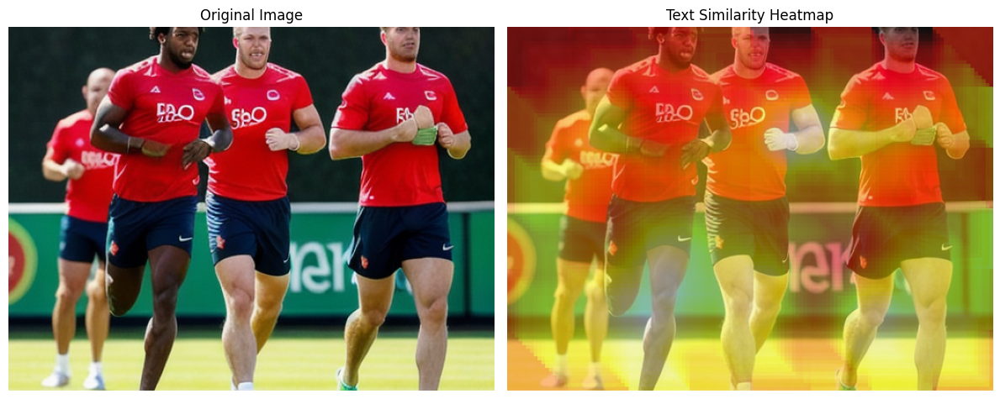

In [ ]:
#added for B1------B16 using batching 
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch
import torch.nn.functional as F
from torchvision import transforms
from transformers import CLIPProcessor, CLIPModel
from tqdm import tqdm

# Load CLIP model and processor
clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32").eval()
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

@torch.no_grad()
def get_text_embedding(text):
    """Return normalized text embedding."""
    inputs = clip_processor(text=[text], return_tensors="pt", padding=True, truncation=True)
    text_features = clip_model.get_text_features(**inputs)
    return F.normalize(text_features, p=2, dim=-1)#returns a tensor of shape (1, 512)

@torch.no_grad()
def get_patch_embeddings(patches):
    """Return normalized embeddings for a batch of image patches."""
    inputs = clip_processor(images=patches, return_tensors="pt", padding=True)
    image_features = clip_model.get_image_features(**inputs)
    return F.normalize(image_features, p=2, dim=-1)

def generate_heat_map_inbatch(image, window_size=64, stride=4):
    """Generate sub_batches of patches + their coordinates with offsets in both directions."""
    img_w, img_h = image.size
    super_batch = []
    n_offsets = window_size // stride

    for offset_y in range(n_offsets):
        for offset_x in range(n_offsets):
            sub_batch = []
            y_start = offset_y * stride
            x_start = offset_x * stride
            for y in range(y_start, img_h - window_size + 1, window_size):
                for x in range(x_start, img_w - window_size + 1, window_size):
                    patch = image.crop((x, y, x + window_size, y + window_size))
                    coords = (y, x)
                    sub_batch.append((patch, coords))
            if sub_batch:
                super_batch.append(sub_batch)
    return super_batch



def get_batches(super_batch, img, text, window_size=64, batch_size=64):
    img_w, img_h = img.size
    all_patches = [item for sub_batch in super_batch for item in sub_batch]  # [(patch, coords), ...]

    heatmap = np.zeros((img_h, img_w), dtype=np.float32)
    count_map = np.zeros((img_h, img_w), dtype=np.float32)

    text_embedding = get_text_embedding(text)

    for i in range(0, len(all_patches), batch_size):
        current_batch = all_patches[i:i + batch_size]

        patches = [p for p, _ in current_batch]
        coords = [c for _, c in current_batch]

        embed_and_update(patches, coords, text_embedding, heatmap, count_map, window_size)

    # Final normalized heatmap
    heatmap /= (count_map + 1e-6)
    return heatmap, count_map


def embed_and_update(patches, coords, text_emb, heatmap, count_map, window_size):
    """Embed patches, compute similarity with text, update heatmap + count_map."""
    patch_embeds = get_patch_embeddings(patches)
    sims = (patch_embeds @ text_emb.T).squeeze(-1).cpu().numpy()

    for (top, left), score in zip(coords, sims):
        heatmap[top:top+window_size, left:left+window_size] += score
        count_map[top:top+window_size, left:left+window_size] += 1


       #max logic
        

def to_pil_image(np_img):
    """Convert NumPy image (RGB/uint8 or float) to PIL."""
    if np_img.dtype != np.uint8:
        np_img = (np.clip(np_img, 0, 1) * 255).astype(np.uint8)
    if np_img.shape[-1] == 4:
        np_img = np_img[..., :3]
    return Image.fromarray(np_img)


np_img = plt.imread("/home/lovish/PROJECTS/RealnessProject/Images/test_images/f252.png") #MOS=1.0413785592771698
test_img = to_pil_image(np_img)

# Text description
test_text = ("Yes, there are some unrealistic elements. The transition between some arms and bodies is unnatural, and one athlete’s arm appears oddly merged with another, lacking realistic definition.")

flag_no=False
#if test_text starts with "No." or "no." or "no," set flag to True
if test_text.lower().startswith("no"):   
    flag_no = True

super_batch = generate_heat_map_inbatch(test_img, window_size=64, stride=4)
heatmap, count_map = get_batches(super_batch, test_img, test_text, window_size=64, batch_size=64)

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(test_img)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(test_img)
plt.imshow(heatmap, cmap='hot', alpha=0.5)
plt.title("Text Similarity Heatmap")
plt.axis("off")

plt.tight_layout()
plt.show()

In [19]:

super_batch_a_img1 = generate_heat_map_inbatch(test_img1, window_size=64, stride=4)
heatmap_a_img1, count_map_a_img1 = get_batches(super_batch_a_img1, test_img1, test_text1, window_size=64, batch_size=64)
super_batch_b_img1 = generate_heat_map_inbatch(test_img1, window_size=128, stride=8)
heatmap_b_img1, count_map_b_img1 = get_batches(super_batch_b_img1, test_img1, test_text1, window_size=128, batch_size=64)
super_batch_c_img1 = generate_heat_map_inbatch(test_img1, window_size=128, stride=16)
heatmap_c_img1, count_map_c_img1 = get_batches(super_batch_c_img1, test_img1, test_text1, window_size=128, batch_size=64)
heatmap_average_inbatch_img1 = (heatmap_a_img1 + heatmap_b_img1 + heatmap_c_img1)/3

In [20]:

super_batch_a_img2 = generate_heat_map_inbatch(test_img2, window_size=64, stride=4)
heatmap_a_img2, count_map_a_img2 = get_batches(super_batch_a_img2, test_img2, test_text2, window_size=64, batch_size=64)
super_batch_b_img2 = generate_heat_map_inbatch(test_img2, window_size=128, stride=8)
heatmap_b_img2, count_map_b_img2 = get_batches(super_batch_b_img2, test_img2, test_text2, window_size=128, batch_size=64)
super_batch_c_img2 = generate_heat_map_inbatch(test_img2, window_size=128, stride=16)
heatmap_c_img2, count_map_c_img2 = get_batches(super_batch_c_img2, test_img2, test_text2, window_size=128, batch_size=64)
heatmap_average_inbatch_img2 = (heatmap_a_img2 + heatmap_b_img2 + heatmap_c_img2)/3

In [21]:

super_batch_a_img3 = generate_heat_map_inbatch(test_img3, window_size=64, stride=4)
heatmap_a_img3, count_map_a_img3 = get_batches(super_batch_a_img3, test_img3, test_text3, window_size=64, batch_size=64)
super_batch_b_img3 = generate_heat_map_inbatch(test_img3, window_size=128, stride=8)
heatmap_b_img3, count_map_b_img3 = get_batches(super_batch_b_img3, test_img3, test_text3, window_size=128, batch_size=64)
super_batch_c_img3 = generate_heat_map_inbatch(test_img3, window_size=128, stride=16)
heatmap_c_img3, count_map_c_img3 = get_batches(super_batch_c_img3, test_img3, test_text3, window_size=128, batch_size=64)
heatmap_average_inbatch_img3 = (heatmap_a_img3 + heatmap_b_img3 + heatmap_c_img3)/3

In [22]:
print(heatmap_avg1 - heatmap_average_inbatch_img1)

[[0.00109054 0.00109054 0.00109054 ... 0.00208832 0.00208832 0.00208832]
 [0.00109054 0.00109054 0.00109054 ... 0.00208832 0.00208832 0.00208832]
 [0.00109054 0.00109054 0.00109054 ... 0.00208832 0.00208832 0.00208832]
 ...
 [0.00583929 0.00583929 0.00583929 ... 0.02057296 0.02057296 0.02057296]
 [0.00583929 0.00583929 0.00583929 ... 0.02057296 0.02057296 0.02057296]
 [0.00583929 0.00583929 0.00583929 ... 0.02057296 0.02057296 0.02057296]]


In [23]:
print(heatmap_avg2 - heatmap_average_inbatch_img2)

[[-0.02486441 -0.02486441 -0.02486441 ... -0.02583601 -0.02583601
  -0.02583601]
 [-0.02486441 -0.02486441 -0.02486441 ... -0.02583601 -0.02583601
  -0.02583601]
 [-0.02486441 -0.02486441 -0.02486441 ... -0.02583601 -0.02583601
  -0.02583601]
 ...
 [-0.00337227 -0.00337227 -0.00337227 ... -0.01536103 -0.01536103
  -0.01536103]
 [-0.00337227 -0.00337227 -0.00337227 ... -0.01536103 -0.01536103
  -0.01536103]
 [-0.00337227 -0.00337227 -0.00337227 ... -0.01536103 -0.01536103
  -0.01536103]]


In [24]:
print(heatmap_avg3 - heatmap_average_inbatch_img3)

[[ 0.00384955  0.00384955  0.00384955 ... -0.00189945 -0.00189945
  -0.00189945]
 [ 0.00384955  0.00384955  0.00384955 ... -0.00189945 -0.00189945
  -0.00189945]
 [ 0.00384955  0.00384955  0.00384955 ... -0.00189945 -0.00189945
  -0.00189945]
 ...
 [-0.00279574 -0.00279574 -0.00279574 ... -0.00209731 -0.00209731
  -0.00209731]
 [-0.00279574 -0.00279574 -0.00279574 ... -0.00209731 -0.00209731
  -0.00209731]
 [-0.00279574 -0.00279574 -0.00279574 ... -0.00209731 -0.00209731
  -0.00209731]]


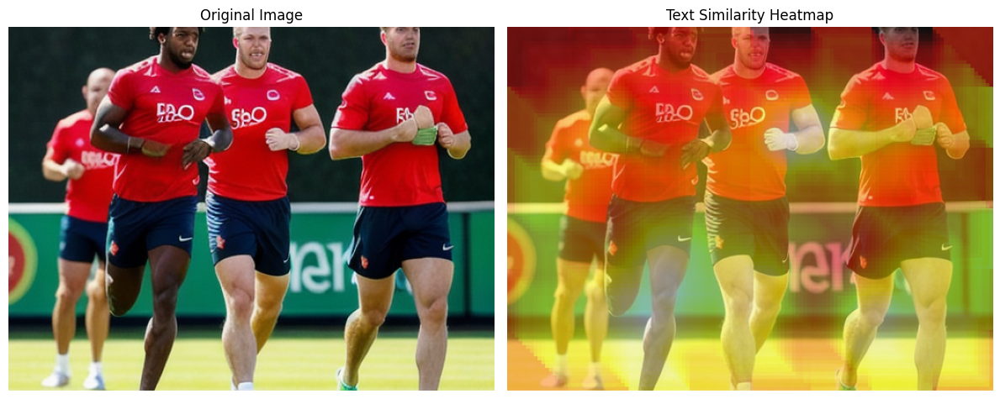

In [25]:
# for window size = 128 and stride = 4
super_batch = generate_heat_map(test_img, window_size=64, stride=4)
heatmap, count_map = get_batches(super_batch, test_img, test_text, window_size=64, batch_size=32)

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(test_img)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(test_img)
plt.imshow(heatmap, cmap='hot', alpha=0.5)
plt.title("Text Similarity Heatmap")
plt.axis("off")

plt.tight_layout()
plt.show()

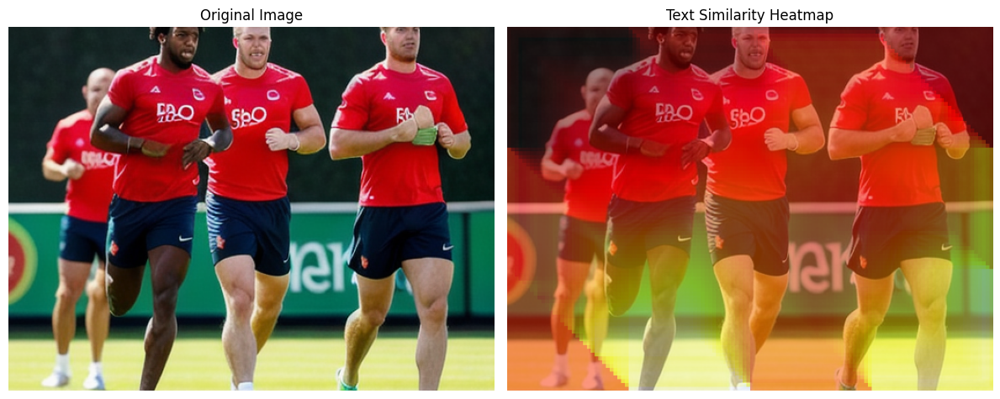

In [26]:

super_batch = generate_heat_map(test_img, window_size=128, stride=4)
heatmap, count_map = get_batches(super_batch, test_img, test_text, window_size=128, batch_size=64)

def plot_heatmap(test_img, heatmap):
    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(test_img)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(test_img)
    plt.imshow(heatmap, cmap='hot', alpha=0.5)
    plt.title("Text Similarity Heatmap")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

plot_heatmap(test_img, heatmap)

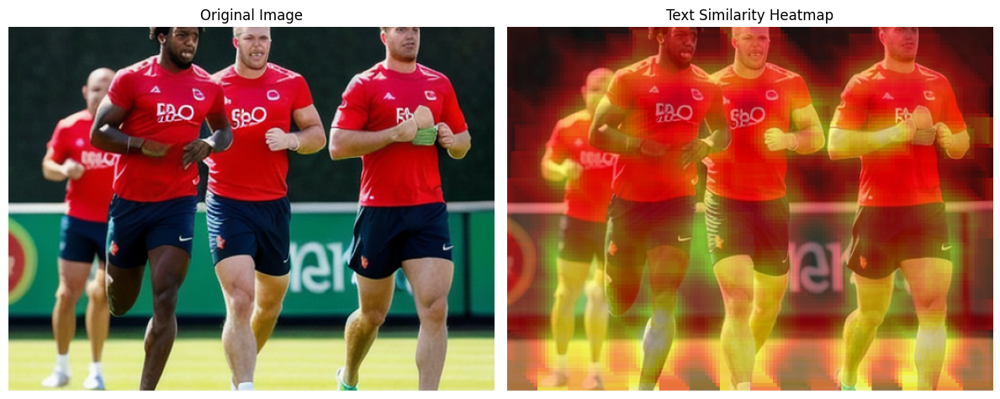

In [27]:

super_batch = generate_heat_map(test_img, window_size=32, stride=4)
heatmap, count_map = get_batches(super_batch, test_img, test_text, window_size=32, batch_size=64)

plot_heatmap(test_img, heatmap)

In [56]:
@torch.no_grad()
def get_text_embedding(text):
    """Return normalized text embedding."""
    inputs = clip_processor(text=[text], return_tensors="pt", padding=True, truncation=True)
    text_features = clip_model.get_text_features(**inputs)
    return F.normalize(text_features, p=2, dim=-1)
test_text = ("Yes, there are some unrealistic elements. The transition between some arms and bodies is unnatural, and one athlete’s arm appears oddly merged with another, lacking realistic definition.")

print(get_text_embedding(test_text).size())
print(get_text_embedding(test_text))

torch.Size([1, 512])
tensor([[ 2.6373e-02,  5.7566e-02, -1.2860e-02, -2.9838e-02,  1.7912e-03,
          7.6882e-02,  3.7921e-02,  6.9665e-02,  3.4590e-02,  2.6519e-02,
         -1.2674e-02, -2.8570e-02,  3.0150e-02, -3.8579e-03, -2.2983e-02,
         -2.0439e-03, -1.9704e-02,  2.8101e-02,  6.6557e-03,  2.3867e-02,
         -5.1368e-02, -1.8131e-02, -2.0259e-02, -9.1365e-03, -6.6950e-03,
         -1.8984e-02, -3.0172e-03, -2.0460e-02,  1.0582e-02, -3.4087e-02,
         -8.9372e-03,  1.2677e-02,  1.8149e-02,  3.1031e-02,  8.3657e-03,
         -3.0235e-02,  1.4658e-02, -1.5765e-02,  2.3666e-02, -1.5554e-03,
         -3.4499e-02, -1.1722e-03, -1.8283e-02,  3.6424e-02, -1.6213e-02,
          3.9921e-02, -6.0021e-03,  4.0336e-02, -2.3612e-02, -3.0052e-03,
          2.9678e-02,  2.1248e-02,  1.2433e-02, -5.2647e-03, -6.9243e-03,
         -1.1418e-02, -1.8820e-02,  5.1353e-03, -7.7320e-03,  6.5582e-03,
          8.9007e-02, -2.7848e-02, -1.0262e-02, -1.6250e-02,  6.1769e-03,
         -3.2343e

In [57]:
def get_batches(super_batch, img, text, window_size=64, batch_size=64):
    img_w, img_h = img.size
    all_patches = [item for sub_batch in super_batch for item in sub_batch]  # [(patch, coords), ...]

    heatmap = np.zeros((img_h, img_w), dtype=np.float32)
    count_map = np.zeros((img_h, img_w), dtype=np.float32)

    text_embedding = get_text_embedding(text)

    # just first batch
    current_batch = all_patches[:batch_size]

    patches = [p for p, _ in current_batch]
    x = get_patch_embeddings(patches)   # shape: (batch_size, d)

    sims = sims = (x @ text_embedding.T).squeeze(-1).detach().cpu().numpy()

    print("Patch embeddings shape:", x.size())
    print("Text embedding shape:", text_embedding.size())
    print("Similarity shape:", sims.shape)
    print("Similarity scores:", sims)

    return x, sims
super_batch = generate_heat_map(test_img, window_size=64, stride=4)
x, sims = get_batches(super_batch, test_img, test_text, window_size=64, batch_size=64)


Patch embeddings shape: torch.Size([64, 512])
Text embedding shape: torch.Size([1, 512])
Similarity shape: (64,)
Similarity scores: [0.22252679 0.22773673 0.23340489 0.2420109  0.20254333 0.23287529
 0.19264257 0.23461246 0.24302235 0.28133616 0.21663764 0.26027828
 0.29198927 0.27958056 0.24894083 0.27475613 0.25359824 0.23732701
 0.24865521 0.24002351 0.27689764 0.25367418 0.23934181 0.24958472
 0.25789675 0.23506299 0.27340713 0.26251683 0.24638756 0.23203667
 0.26103964 0.27544367 0.25003737 0.2901607  0.29513466 0.27863362
 0.28327125 0.2665811  0.29308426 0.2645983  0.24951747 0.2548422
 0.27655834 0.2629678  0.25320548 0.2594501  0.26885766 0.25216433
 0.22080839 0.21736547 0.23079762 0.24678332 0.2058719  0.23511305
 0.20035753 0.24245575 0.2804239  0.2267625  0.23058125 0.2918854
 0.29555544 0.24712683 0.25703532 0.22819191]


In [ ]:

def embed_and_update(patches, coords, text_emb, heatmap, count_map, window_size):
    """Embed patches, compute similarity with text, update heatmap + count_map."""
    patch_embeds = get_patch_embeddings(patches)
    sims = (patch_embeds @ text_emb.T).squeeze(-1).cpu().numpy()

    for (top, left), score in zip(coords, sims):
        heatmap[top:top+window_size, left:left+window_size] += score
        count_map[top:top+window_size, left:left+window_size] += 1


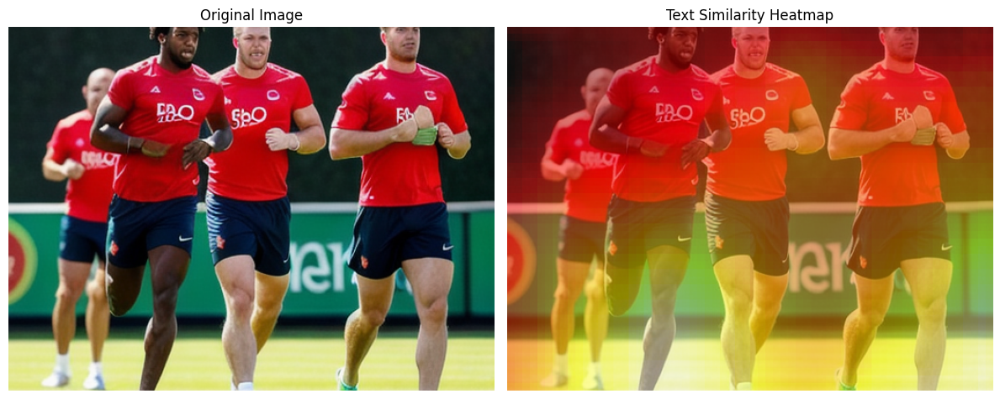

In [14]:
heatmap_max = np.maximum(heatmap1, np.maximum(heatmap2, heatmap3))
heatmap_avg = (heatmap1 + heatmap2 + heatmap3) / 3
# Visualize original image and heatmap overlay
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(test_img)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(test_img)
plt.imshow(heatmap_avg, cmap='hot', alpha=0.5)
plt.title("Text Similarity Heatmap")
plt.axis("off")

plt.tight_layout()
plt.show()

In [17]:
import numpy as np
from PIL import Image
import torch
import torch.nn.functional as F
from transformers import CLIPProcessor, CLIPModel

# Load CLIP model and processor
clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32").eval()
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

@torch.no_grad()
def get_text_embedding(text):
    inputs = clip_processor(text=[text], return_tensors="pt", padding=True, truncation=True)
    text_features = clip_model.get_text_features(**inputs)
    return F.normalize(text_features, p=2, dim=-1)

@torch.no_grad()
def get_patch_embeddings(patches):
    
    inputs = clip_processor(images=patches, return_tensors="pt", padding=True)
    image_features = clip_model.get_image_features(**inputs)
    return F.normalize(image_features, p=2, dim=-1)

def merge_patches(image, top, left, base_size, n):
    
    big_size = base_size * n
    new_patch = Image.new("RGB", (big_size, big_size))

    for i in range(n):
        for j in range(n):
            patch = image.crop((
                left + j*base_size,
                top + i*base_size,
                left + (j+1)*base_size,
                top + (i+1)*base_size
            ))
            new_patch.paste(patch, (j*base_size, i*base_size))

    return new_patch

def generate_heat_map(image, text, base_size, merge_n, stride, batch_size):
   
    img_w, img_h = image.size
    big_size = base_size * merge_n  # final patch size

    heatmap = np.zeros((img_h, img_w), dtype=np.float32)
    count_map = np.zeros((img_h, img_w), dtype=np.float32)

    text_embedding = get_text_embedding(text)

    patches, patch_coords = [], []

    # Slide over image
    for top in range(0, img_h - big_size + 1, stride):
        for left in range(0, img_w - big_size + 1, stride):
            patch = merge_patches(image, top, left, base_size=base_size, n=merge_n)
            patches.append(patch)
            patch_coords.append((top, left))

            # Process in batches
            if len(patches) == batch_size:
                embed_and_update(patches, patch_coords, text_embedding, heatmap, count_map, big_size)
                patches, patch_coords = [], []

    # Remaining patches
    if patches:
        embed_and_update(patches, patch_coords, text_embedding, heatmap, count_map, big_size)

    # Normalize heatmap
    np.divide(heatmap, count_map, out=heatmap, where=count_map != 0)
    return heatmap

def embed_and_update(patches, coords, text_emb, heatmap, count_map, window_size):
    """Helper function to embed patches and update heatmap."""
    patch_embeds = get_patch_embeddings(patches)
    sims = (patch_embeds @ text_emb.T).squeeze(-1).cpu().numpy()

    for (top, left), score in zip(coords, sims):
        heatmap[top:top+window_size, left:left+window_size] += score
        count_map[top:top+window_size, left:left+window_size] += 1

def to_pil_image(np_img):
    """Convert NumPy image (RGB/uint8 or float) to PIL."""
    if np_img.dtype != np.uint8:
        np_img = (np.clip(np_img, 0, 1) * 255).astype(np.uint8)
    if np_img.shape[-1] == 4:
        np_img = np_img[..., :3]
    return Image.fromarray(np_img)

# --- Main Execution ---

# Load and prepare image
np_img = plt.imread("/home/lovish/PROJECTS/RealnessProject/Images/test_images/f252.png") #MOS=1.0413785592771698
test_img = to_pil_image(np_img)

# Text description
test_text = ("Yes, there are some unrealistic elements. The transition between some arms and bodies is unnatural, and one athlete’s arm appears oddly merged with another, lacking realistic definition.")

flag_no=False

if test_text.lower().startswith("no"):   
    flag_no = True





In [18]:


heatmap_32_16 = generate_heat_map(test_img, test_text, base_size=32, merge_n=1, stride=16, batch_size=64)
heatmap_64_16 = generate_heat_map(test_img, test_text, base_size=32, merge_n=2, stride=16, batch_size=64)
heatmap_128_16 = generate_heat_map(test_img, test_text, base_size=32, merge_n=4, stride=16, batch_size=64)

In [19]:
heatmap_32_4 = generate_heat_map(test_img, test_text, base_size=32, merge_n=1, stride=4, batch_size=64)
heatmap_64_4 = generate_heat_map(test_img, test_text, base_size=32, merge_n=2, stride=4, batch_size=64)
heatmap_128_4 = generate_heat_map(test_img, test_text, base_size=32, merge_n=4, stride=4, batch_size=64)


In [20]:
heatmap_32_8 = generate_heat_map(test_img, test_text, base_size=32, merge_n=1, stride=8, batch_size=64)
heatmap_64_8 = generate_heat_map(test_img, test_text, base_size=32, merge_n=2, stride=8, batch_size=64)
heatmap_128_8 = generate_heat_map(test_img, test_text, base_size=32, merge_n=4, stride=8, batch_size=64)


In [21]:
heatmap_avg = (heatmap_128_16 + heatmap_128_8 +  heatmap_128_4) / 3


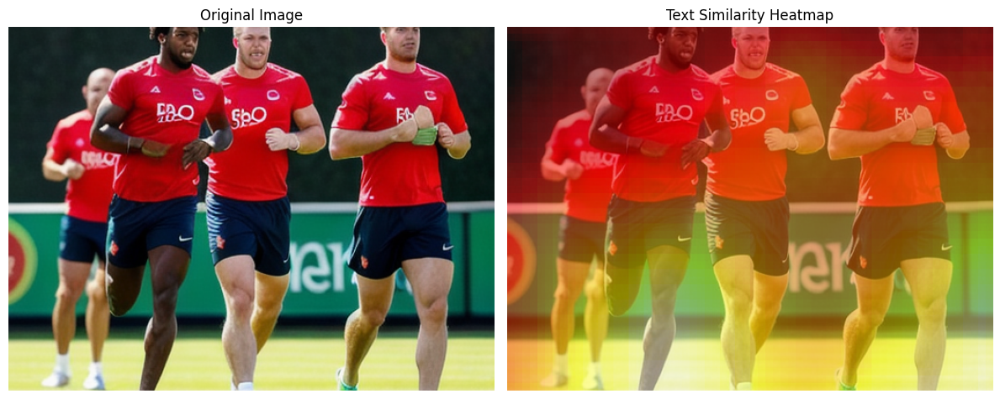

In [22]:
# Visualize original image and heatmap overlay
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(test_img)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(test_img)
plt.imshow(heatmap_avg, cmap='hot', alpha=0.5)
plt.title("Text Similarity Heatmap")
plt.axis("off")

plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
from PIL import Image
import torch
import torch.nn.functional as F
from transformers import CLIPProcessor, CLIPModel
import matplotlib.pyplot as plt

clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32").eval()
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

@torch.no_grad()
def get_text_embedding(text):
    """Return normalized text embedding."""
    inputs = clip_processor(text=[text], return_tensors="pt", padding=True, truncation=True)
    text_features = clip_model.get_text_features(**inputs)
    return F.normalize(text_features, p=2, dim=-1)

@torch.no_grad()
def get_patch_embeddings(patches):
    """Return normalized embeddings for a batch of image patches."""
    inputs = clip_processor(images=patches, return_tensors="pt", padding=True)
    image_features = clip_model.get_image_features(**inputs)
    return F.normalize(image_features, p=2, dim=-1)


def precompute_patch_embeddings(image, base_size=32, batch_size=64):
   
    img_w, img_h = image.size
    patch_dict = {}

    patches, coords = [], []
    for top in range(0, img_h, base_size):
        for left in range(0, img_w, base_size):
            patch = image.crop((left, top, left + base_size, top + base_size))
            patches.append(patch)
            coords.append((top, left))

            # Process in batches
            if len(patches) == batch_size:
                embeds = get_patch_embeddings(patches)
                for (t, l), emb in zip(coords, embeds):
                    patch_dict[(t, l)] = emb
                patches, coords = [], []

    # Remaining patches
    if patches:
        embeds = get_patch_embeddings(patches)
        for (t, l), emb in zip(coords, embeds):
            patch_dict[(t, l)] = emb

    return patch_dict

def generate_heat_map(image, text, patch_dict, base_size=32, merge_n=4, stride=16):
    
    img_w, img_h = image.size
    big_size = base_size * merge_n  # e.g. 128 if 32*4

    heatmap = np.zeros((img_h, img_w), dtype=np.float32)
    count_map = np.zeros((img_h, img_w), dtype=np.float32)

    text_embedding = get_text_embedding(text)

    for top in range(0, img_h - big_size + 1, stride):
        for left in range(0, img_w - big_size + 1, stride):

            # collect embeddings of all base patches in this window
            merged_embs = []
            for dy in range(0, big_size, base_size):
                for dx in range(0, big_size, base_size):
                    qy = ((top + dy) // base_size) * base_size
                    qx = ((left + dx) // base_size) * base_size
                    merged_embs.append(patch_dict[(qy, qx)])


            # merge embeddings (average)
            window_emb = torch.stack(merged_embs).mean(dim=0, keepdim=True)

            # similarity with text
            sim = (window_emb @ text_embedding.T).item()

            # update heatmap
            heatmap[top:top+big_size, left:left+big_size] += sim
            count_map[top:top+big_size, left:left+big_size] += 1

    # normalize
    np.divide(heatmap, count_map, out=heatmap, where=count_map != 0)
    return heatmap

# -------------------- Helper --------------------
def to_pil_image(np_img):
    """Convert NumPy image (RGB/uint8 or float) to PIL."""
    if np_img.dtype != np.uint8:
        np_img = (np.clip(np_img, 0, 1) * 255).astype(np.uint8)
    if np_img.shape[-1] == 4:
        np_img = np_img[..., :3]
    return Image.fromarray(np_img)


In [26]:

np_img = plt.imread("/home/lovish/PROJECTS/RealnessProject/Images/test_images/f252.png")
test_img = to_pil_image(np_img)

# Text description
test_text = ("Yes, there are some unrealistic elements. "
                "The transition between some arms and bodies is unnatural, "
                "and one athlete’s arm appears oddly merged with another, lacking realistic definition.")

# Step 1: Precompute 32x32 embeddings
patch_dict = precompute_patch_embeddings(test_img, base_size=32)

# Step 2: Generate heatmap by reusing embeddings
heatmap_128_16 = generate_heat_map(test_img, test_text, patch_dict,
                            base_size=32, merge_n=4, stride=16)
heatmap_128_8 = generate_heat_map( test_img,test_text, patch_dict,
                            base_size=32, merge_n=4, stride=8)
heatmap_128_4 = generate_heat_map( test_img, test_text, patch_dict,
                            base_size=32, merge_n=4, stride=4)
heatmap_avg = (heatmap_128_16 + heatmap_128_8 +  heatmap_128_4) / 3
#


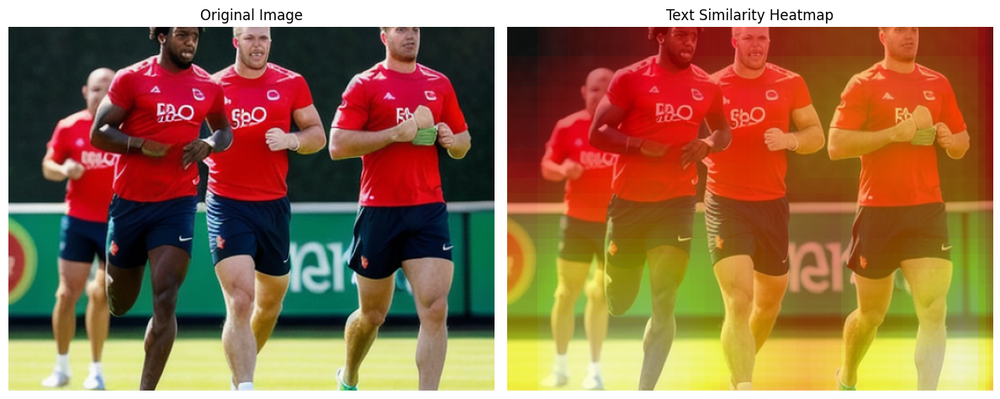

In [27]:
# Visualize original image and heatmap overlay
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(test_img)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(test_img)
plt.imshow(heatmap_avg, cmap='hot', alpha=0.5)
plt.title("Text Similarity Heatmap")
plt.axis("off")

plt.tight_layout()
plt.show()

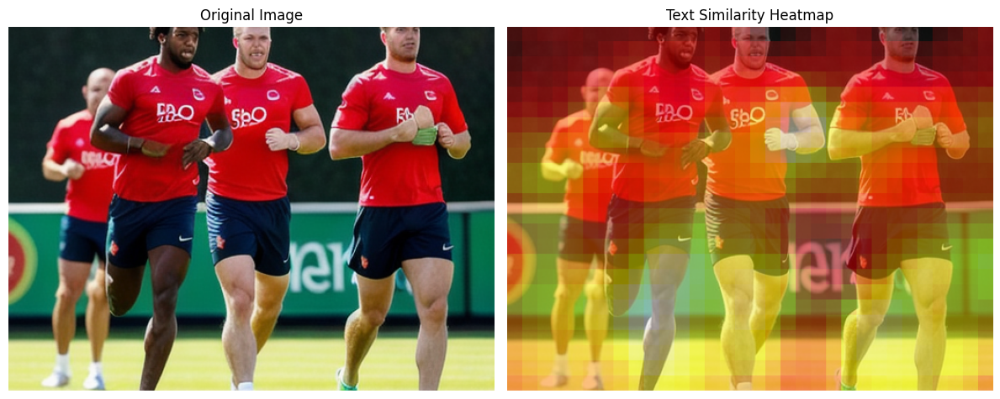

In [16]:
# Visualize original image and heatmap overlay
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(test_img)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(test_img)
plt.imshow(heatmap_64, cmap='hot', alpha=0.5)
plt.title("Text Similarity Heatmap")
plt.axis("off")

plt.tight_layout()
plt.show()

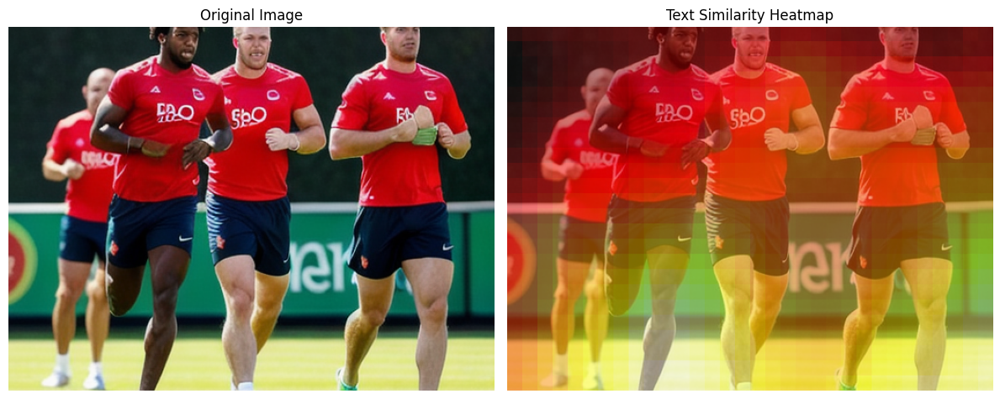

In [17]:
# Visualize original image and heatmap overlay
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(test_img)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(test_img)
plt.imshow(heatmap_128, cmap='hot', alpha=0.5)
plt.title("Text Similarity Heatmap")
plt.axis("off")

plt.tight_layout()
plt.show()

# Sliding Window

In [10]:
import torch
import torch.nn.functional as F
from torchvision import transforms
from transformers import CLIPProcessor, CLIPModel
from PIL import Image
import numpy as np

# Load CLIP model and processor
clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
clip_model.eval()

def preprocess_image(image):
    """Preprocess image for CLIP input."""
    return clip_processor(images=image, return_tensors="pt")["pixel_values"]

def get_text_embedding(text):
    """Get text embedding using CLIP."""
    with torch.no_grad():
        inputs = clip_processor(text=[text], return_tensors="pt", padding=True, truncation=True)
        text_features = clip_model.get_text_features(**inputs)
        return F.normalize(text_features, p=2, dim=-1)

def get_patch_embedding(patch):
    """Get normalized embedding of an image patch using CLIP."""
    pixel_values = preprocess_image(patch)
    with torch.no_grad():
        image_features = clip_model.get_image_features(pixel_values)
        return F.normalize(image_features, p=2, dim=-1)

def generate_heat_map(image, text, window_size=64, stride=32):
    """
    Generate heatmap of similarity between image patches and a text description.

    Args:
        image (PIL.Image): Input image.
        text (str): Text to compare with image patches.
        window_size (int): Size of the sliding window.
        stride (int): Stride of the sliding window.
    
    Returns:
        heatmap (numpy.ndarray): Heatmap of similarity scores.
    """
    img_w, img_h = image.size
    heatmap = np.zeros((img_h, img_w), dtype=np.float32)
    count_map = np.zeros((img_h, img_w), dtype=np.float32)

    text_embedding = get_text_embedding(text)

    # Slide window over image
    for top in range(0, img_h - window_size + 1, stride):
        for left in range(0, img_w - window_size + 1, stride):
            patch = image.crop((left, top, left + window_size, top + window_size))
            patch_embedding = get_patch_embedding(patch)
            
            # Cosine similarity
            score = torch.matmul(patch_embedding, text_embedding.T).item()

            # Add score to heatmap region
            heatmap[top:top+window_size, left:left+window_size] += score
            count_map[top:top+window_size, left:left+window_size] += 1

    # Normalize by count to get average scores
    heatmap = np.divide(heatmap, count_map, out=np.zeros_like(heatmap), where=count_map!=0)

    return heatmap


Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


In [11]:
#Shubhi added this cell 
import torch
import torch.nn.functional as F
from torchvision import transforms
from transformers import CLIPProcessor, CLIPModel
from PIL import Image
import numpy as np

# Load CLIP model and processor
clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
clip_model.eval()

def preprocess_image(image):
    """Preprocess image for CLIP input."""
    return clip_processor(images=image, return_tensors="pt")["pixel_values"]

def get_text_embedding(text):
    """Get text embedding using CLIP."""
    with torch.no_grad():
        inputs = clip_processor(text=[text], return_tensors="pt", padding=True, truncation=True)
        text_features = clip_model.get_text_features(**inputs)
        return F.normalize(text_features, p=2, dim=-1)

def get_patch_embedding(patch):
    """Get normalized embedding of an image patch using CLIP."""
    pixel_values = preprocess_image(patch)
    with torch.no_grad():
        image_features = clip_model.get_image_features(pixel_values)
        return F.normalize(image_features, p=2, dim=-1)

def generate_heat_map(image, text, window_size=64, stride=32):
    """
    Generate heatmap and patch pixel dictionaries with similarity scores.

    Returns:
        heatmap (numpy.ndarray): Heatmap of similarity scores.
        patch_dicts (list): List of dictionaries for each patch.
    """
    img_w, img_h = image.size
    heatmap = np.zeros((img_h, img_w), dtype=np.float32)
    count_map = np.zeros((img_h, img_w), dtype=np.float32)

    text_embedding = get_text_embedding(text)
    patch_dicts = []  # list to hold patch-wise dictionaries

    # Slide window over image
    for top in range(0, img_h - window_size + 1, stride):
        for left in range(0, img_w - window_size + 1, stride):
            patch = image.crop((left, top, left + window_size, top + window_size))
            patch_embedding = get_patch_embedding(patch)

            # Cosine similarity score
            score = torch.matmul(patch_embedding, text_embedding.T).item()

            # Add score to heatmap and count map
            heatmap[top:top+window_size, left:left+window_size] += score
            count_map[top:top+window_size, left:left+window_size] += 1

            # Create patch pixel dictionary
            patch_dict = {}
            pixel_number = 1  # start pixel numbering from 1

            for y in range(window_size):
                for x in range(window_size):
                    patch_dict[pixel_number] = [window_size, stride, score]
                    pixel_number += 1

            patch_dicts.append(patch_dict)  # store dict for this patch

    # Normalize heatmap
    heatmap = np.divide(heatmap, count_map, out=np.zeros_like(heatmap), where=count_map != 0)

    return heatmap, patch_dicts


In [12]:
# Shubhi modified cell 
import torch
import torch.nn.functional as F
from torchvision import transforms
from transformers import CLIPProcessor, CLIPModel
from PIL import Image
import numpy as np

# Load CLIP model and processor
clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
clip_model.eval()

def preprocess_image(image):
    """Preprocess image for CLIP input."""
    return clip_processor(images=image, return_tensors="pt")["pixel_values"]

def get_text_embedding(text):
    """Get text embedding using CLIP."""
    with torch.no_grad():
        inputs = clip_processor(text=[text], return_tensors="pt", padding=True, truncation=True)
        text_features = clip_model.get_text_features(**inputs)
        return F.normalize(text_features, p=2, dim=-1)

def get_patch_embedding(patch):
    """Get normalized embedding of an image patch using CLIP."""
    pixel_values = preprocess_image(patch)
    with torch.no_grad():
        image_features = clip_model.get_image_features(pixel_values)
        return F.normalize(image_features, p=2, dim=-1)

def generate_heat_map(image, text, window_size=64, stride=32):
    """
    Generate heatmap and patch pixel dictionaries with similarity scores.

    Returns:
        heatmap (numpy.ndarray): Heatmap of similarity scores.
        patch_dicts (list): List of dictionaries for each patch.
    """
    img_w, img_h = image.size
    heatmap = np.zeros((img_h, img_w), dtype=np.float32)
    count_map = np.zeros((img_h, img_w), dtype=np.float32)

    text_embedding = get_text_embedding(text)
    patch_dicts = []  # list to hold patch-wise dictionaries

    # Slide window over image
    for top in range(0, img_h - window_size + 1, stride):
        for left in range(0, img_w - window_size + 1, stride):
            patch = image.crop((left, top, left + window_size, top + window_size))
            patch_embedding = get_patch_embedding(patch)

            # Cosine similarity score
            score = torch.matmul(patch_embedding, text_embedding.T).item()

            # Add score to heatmap and count map
            heatmap[top:top+window_size, left:left+window_size] += score
            count_map[top:top+window_size, left:left+window_size] += 1

            # Create patch pixel dictionary with coordinates as keys
            patch_dict = {}
            for y in range(window_size):
                for x in range(window_size):
                    global_x, global_y = left + x, top + y
                    patch_dict[(global_x, global_y)] = [window_size, stride, score]

            patch_dicts.append(patch_dict)  # store dict for this patch

    # Normalize heatmap
    heatmap = np.divide(heatmap, count_map, out=np.zeros_like(heatmap), where=count_map != 0)

    return heatmap, patch_dicts


In [13]:
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

# Convert numpy image (from plt.imread) to PIL image
def to_pil_image(np_img):
    if np_img.dtype != np.uint8:
        np_img = (np_img * 255).astype(np.uint8)
    if np_img.shape[-1] == 4:
        np_img = np_img[..., :3]  # Drop alpha channel if exists
    return Image.fromarray(np_img)

np_img = plt.imread("/home/lovish/PROJECTS/RealnessProject/Images/test_images/f108.png")
test_img = to_pil_image(np_img)
test_text = "Yes. The bridge features an unrealistic, irregular structure with warped and inconsistent arches that do not align with real engineering or architectural designs for functional bridges."

heatmap1, patch_dicts1 = generate_heat_map(test_img, test_text, window_size=64, stride=32)
heatmap2, patch_dicts2 = generate_heat_map(test_img, test_text, window_size=32, stride=16)
heatmap3, patch_dicts3 = generate_heat_map(test_img, test_text, window_size=16, stride=8)
heatmap4, patch_dicts4 = generate_heat_map(test_img, test_text, window_size=64, stride=16)

# Access the first patch's dictionary
first_patch_dict = patch_dicts1[0]

print("First patch dictionary:")
for pixel_num, info in first_patch_dict.items():
    print(f"Pixel {pixel_num}: window_size={info[0]}, stride={info[1]}, score={info[2]:.4f}")


First patch dictionary:
Pixel (0, 0): window_size=64, stride=32, score=0.2047
Pixel (1, 0): window_size=64, stride=32, score=0.2047
Pixel (2, 0): window_size=64, stride=32, score=0.2047
Pixel (3, 0): window_size=64, stride=32, score=0.2047
Pixel (4, 0): window_size=64, stride=32, score=0.2047
Pixel (5, 0): window_size=64, stride=32, score=0.2047
Pixel (6, 0): window_size=64, stride=32, score=0.2047
Pixel (7, 0): window_size=64, stride=32, score=0.2047
Pixel (8, 0): window_size=64, stride=32, score=0.2047
Pixel (9, 0): window_size=64, stride=32, score=0.2047
Pixel (10, 0): window_size=64, stride=32, score=0.2047
Pixel (11, 0): window_size=64, stride=32, score=0.2047
Pixel (12, 0): window_size=64, stride=32, score=0.2047
Pixel (13, 0): window_size=64, stride=32, score=0.2047
Pixel (14, 0): window_size=64, stride=32, score=0.2047
Pixel (15, 0): window_size=64, stride=32, score=0.2047
Pixel (16, 0): window_size=64, stride=32, score=0.2047
Pixel (17, 0): window_size=64, stride=32, score=0.2

In [15]:
# Access the last patch's dictionary
first_patch_dict = patch_dicts1[-1]
print("First patch dictionary:")
for pixel_num, info in first_patch_dict.items():
    print(f"Pixel {pixel_num}: window_size={info[0]}, stride={info[1]}, score={info[2]:.4f}")

First patch dictionary:
Pixel (448, 320): window_size=64, stride=32, score=0.2543
Pixel (449, 320): window_size=64, stride=32, score=0.2543
Pixel (450, 320): window_size=64, stride=32, score=0.2543
Pixel (451, 320): window_size=64, stride=32, score=0.2543
Pixel (452, 320): window_size=64, stride=32, score=0.2543
Pixel (453, 320): window_size=64, stride=32, score=0.2543
Pixel (454, 320): window_size=64, stride=32, score=0.2543
Pixel (455, 320): window_size=64, stride=32, score=0.2543
Pixel (456, 320): window_size=64, stride=32, score=0.2543
Pixel (457, 320): window_size=64, stride=32, score=0.2543
Pixel (458, 320): window_size=64, stride=32, score=0.2543
Pixel (459, 320): window_size=64, stride=32, score=0.2543
Pixel (460, 320): window_size=64, stride=32, score=0.2543
Pixel (461, 320): window_size=64, stride=32, score=0.2543
Pixel (462, 320): window_size=64, stride=32, score=0.2543
Pixel (463, 320): window_size=64, stride=32, score=0.2543
Pixel (464, 320): window_size=64, stride=32, sco

In [14]:
# Combine all patch dict lists
all_patch_dicts = [patch_dicts1, patch_dicts2, patch_dicts3, patch_dicts4]

final_dict = {}

# Iterate over all patch_dicts
for patch_dict_list in all_patch_dicts:           # loop over list of dicts
    for patch_dict in patch_dict_list:            # loop over each dict
        for pixel_coord, (window_size, stride, score) in patch_dict.items():
            if pixel_coord not in final_dict:
                final_dict[pixel_coord] = 0.0
            final_dict[pixel_coord] += score      # accumulate MOS scores


In [19]:
# Print last 100 elements of final_dict
for k, v in list(final_dict.items())[-100:]:
    print(k, v)


(508, 380) 0.9429311752319336
(509, 380) 0.9429311752319336
(510, 380) 0.9429311752319336
(511, 380) 0.9429311752319336
(480, 381) 1.6594178527593613
(481, 381) 1.6594178527593613
(482, 381) 1.6594178527593613
(483, 381) 1.6594178527593613
(484, 381) 1.6594178527593613
(485, 381) 1.6594178527593613
(486, 381) 1.6594178527593613
(487, 381) 1.6594178527593613
(488, 381) 1.651857241988182
(489, 381) 1.651857241988182
(490, 381) 1.651857241988182
(491, 381) 1.651857241988182
(492, 381) 1.651857241988182
(493, 381) 1.651857241988182
(494, 381) 1.651857241988182
(495, 381) 1.651857241988182
(496, 381) 1.1567800492048264
(497, 381) 1.1567800492048264
(498, 381) 1.1567800492048264
(499, 381) 1.1567800492048264
(500, 381) 1.1567800492048264
(501, 381) 1.1567800492048264
(502, 381) 1.1567800492048264
(503, 381) 1.1567800492048264
(504, 381) 0.9429311752319336
(505, 381) 0.9429311752319336
(506, 381) 0.9429311752319336
(507, 381) 0.9429311752319336
(508, 381) 0.9429311752319336
(509, 381) 0.94293

In [21]:
# Print last 100 elements of final_dict
for k, v in list(final_dict.items())[:100]:
    print(k, v)


(0, 0) 0.8729996085166931
(1, 0) 0.8729996085166931
(2, 0) 0.8729996085166931
(3, 0) 0.8729996085166931
(4, 0) 0.8729996085166931
(5, 0) 0.8729996085166931
(6, 0) 0.8729996085166931
(7, 0) 0.8729996085166931
(8, 0) 1.101703554391861
(9, 0) 1.101703554391861
(10, 0) 1.101703554391861
(11, 0) 1.101703554391861
(12, 0) 1.101703554391861
(13, 0) 1.101703554391861
(14, 0) 1.101703554391861
(15, 0) 1.101703554391861
(16, 0) 1.5577201396226883
(17, 0) 1.5577201396226883
(18, 0) 1.5577201396226883
(19, 0) 1.5577201396226883
(20, 0) 1.5577201396226883
(21, 0) 1.5577201396226883
(22, 0) 1.5577201396226883
(23, 0) 1.5577201396226883
(24, 0) 1.5633949935436249
(25, 0) 1.5633949935436249
(26, 0) 1.5633949935436249
(27, 0) 1.5633949935436249
(28, 0) 1.5633949935436249
(29, 0) 1.5633949935436249
(30, 0) 1.5633949935436249
(31, 0) 1.5633949935436249
(32, 0) 1.960219293832779
(33, 0) 1.960219293832779
(34, 0) 1.960219293832779
(35, 0) 1.960219293832779
(36, 0) 1.960219293832779
(37, 0) 1.96021929383277

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

# Convert numpy image (from plt.imread) to PIL image
def to_pil_image(np_img):
    if np_img.dtype != np.uint8:
        np_img = (np_img * 255).astype(np.uint8)
    if np_img.shape[-1] == 4:
        np_img = np_img[..., :3]  # Drop alpha channel if exists
    return Image.fromarray(np_img)

# Load and prepare image and text
np_img = plt.imread("/home/lovish/PROJECTS/RealnessProject/Images/test_images/f108.png")
test_img = to_pil_image(np_img)
test_text = "Yes. The bridge features an unrealistic, irregular structure with warped and inconsistent arches that do not align with real engineering or architectural designs for functional bridges."

# Generate heatmap
heatmap, pixel_dict = generate_heat_map(test_img, test_text, window_size=32, stride=8)

# Visualize original image and heatmap overlay
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(test_img)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(test_img)
plt.imshow(heatmap, cmap='hot', alpha=0.5)
plt.title("Text Similarity Heatmap")
plt.axis("off")

plt.tight_layout()
plt.show()

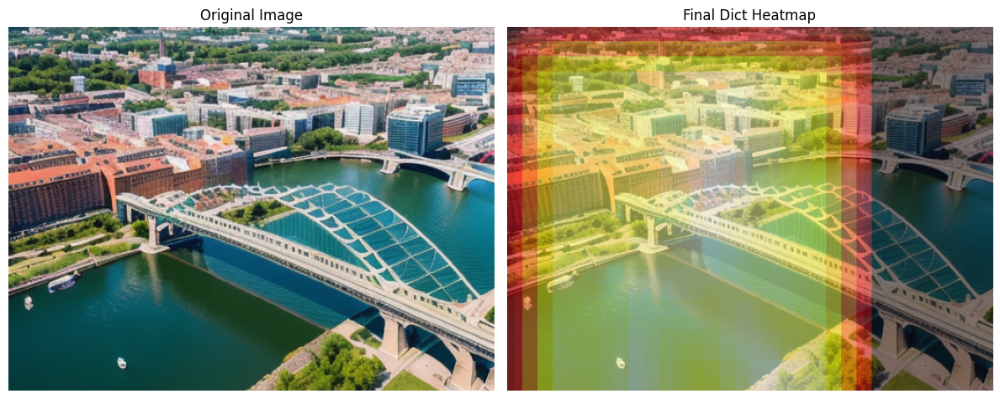

In [15]:
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

# Convert numpy image (from plt.imread) to PIL image
def to_pil_image(np_img):
    if np_img.dtype != np.uint8:
        np_img = (np_img * 255).astype(np.uint8)
    if np_img.shape[-1] == 4:
        np_img = np_img[..., :3]  # Drop alpha channel if exists
    return Image.fromarray(np_img)

# Load image
np_img = plt.imread("/home/lovish/PROJECTS/RealnessProject/Images/test_images/f108.png")
test_img = to_pil_image(np_img)

# Build heatmap from final_dict
heatmap = np.zeros((test_img.height, test_img.width))

for (y, x), value in final_dict.items():   # pixel_coord = (y, x)
    if 0 <= y < heatmap.shape[0] and 0 <= x < heatmap.shape[1]:
        heatmap[y, x] = value

# Normalize heatmap for visualization
if heatmap.max() > 0:
    heatmap = heatmap / heatmap.max()

# Visualize original image and heatmap overlay
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(test_img)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(test_img)
plt.imshow(heatmap, cmap='hot', alpha=0.5)
plt.title("Final Dict Heatmap")
plt.axis("off")

plt.tight_layout()
plt.show()


# test Dataset

In [ ]:
import pandas as pd
import os
import matplotlib.pyplot as plt

# Assumes generate_heat_map and to_pil_image are defined already
# Assumes clip_model and processor are loaded

def visualize_test_set(test_df, test_img_path, window_size=64, stride=32, pause_time=3):
    for idx, row in test_df.iterrows():
        filename = row['filename']
        mos_score = row['MOS']
        description = row['description']

        image_path = os.path.join(test_img_path, filename)
        if not os.path.exists(image_path):
            print(f"Image not found: {image_path}")
            continue

        # Read and convert image
        np_img = plt.imread(image_path)
        test_img = to_pil_image(np_img)

        # Generate heatmap
        heatmap, pixel_dict = generate_heat_map(test_img, description, window_size, stride)

        # Plot original and heatmap
        plt.figure(figsize=(14, 6))

        plt.subplot(1, 2, 1)
        plt.imshow(test_img)
        plt.title(f"Original Image\nMOS: {mos_score:.3f}")
        plt.axis("off")

        plt.subplot(1, 2, 2)
        plt.imshow(test_img)
        plt.imshow(heatmap, cmap='hot', alpha=0.5)
        plt.title("Text Similarity Heatmap")
        plt.axis("off")

        plt.suptitle(f"Description:\n{description}", fontsize=10, y=0.05)
        plt.tight_layout()
        plt.show()

        # Optional pause between images (or use input())
        plt.pause(pause_time)  # or replace with input("Press Enter to continue...")

# Example usage:
visualize_test_set(test_df, test_img_path)

In [ ]:
def generate_heat_map_batched(image, text, window_size=64, stride=32, batch_size=32):
    img_w, img_h = image.size
    heatmap = np.zeros((img_h, img_w), dtype=np.float32)
    count_map = np.zeros((img_h, img_w), dtype=np.float32)
    patch_dicts = []

    text_embedding = get_text_embedding(text)

    patches = []
    coords = []  # store top-left corner of each patch

    # 1. Collect all patches first
    for top in range(0, img_h - window_size + 1, stride):
        for left in range(0, img_w - window_size + 1, stride):
            patch = image.crop((left, top, left + window_size, top + window_size))
            patches.append(patch)
            coords.append((top, left))

    # 2. Process patches in batches
    for i in range(0, len(patches), batch_size):
        batch_patches = patches[i:i+batch_size]
        pixel_values = clip_processor(images=batch_patches, return_tensors="pt")["pixel_values"]

        with torch.no_grad():
            image_features = clip_model.get_image_features(pixel_values)
            image_features = F.normalize(image_features, p=2, dim=-1)

        # 3. Compute similarity for the whole batch
        scores = torch.matmul(image_features, text_embedding.T).squeeze(1).cpu().numpy()

        # 4. Fill heatmap and patch_dicts
        for score, (top, left) in zip(scores, coords[i:i+batch_size]):
            heatmap[top:top+window_size, left:left+window_size] += score
            count_map[top:top+window_size, left:left+window_size] += 1

            patch_dict = {}
            pixel_number = 1
            for _y in range(window_size):
                for _x in range(window_size):
                    patch_dict[pixel_number] = [window_size, stride, float(score)]
                    pixel_number += 1
            patch_dicts.append(patch_dict)

    # 5. Normalize heatmap
    heatmap = np.divide(heatmap, count_map, out=np.zeros_like(heatmap), where=count_map != 0)

    return heatmap, patch_dicts


In [ ]:
import pandas as pd
import os
import matplotlib.pyplot as plt

# Assumes generate_heat_map and to_pil_image are defined already
# Assumes clip_model and processor are loaded

def visualize_test_set(test_df, test_img_path, window_size=64, stride=32, pause_time=3):
    for idx, row in test_df.iterrows():
        filename = row['filename']
        mos_score = row['MOS']
        description = row['description']

        image_path = os.path.join(test_img_path, filename)
        if not os.path.exists(image_path):
            print(f"Image not found: {image_path}")
            continue

        # Read and convert image
        np_img = plt.imread(image_path)
        test_img = to_pil_image(np_img)

        # Generate heatmap
        heatmap, pixel_dict = generate_heat_map_batched(test_img, description, window_size, stride)

        # Plot original and heatmap
        plt.figure(figsize=(14, 6))

        plt.subplot(1, 2, 1)
        plt.imshow(test_img)
        plt.title(f"Original Image\nMOS: {mos_score:.3f}")
        plt.axis("off")

        plt.subplot(1, 2, 2)
        plt.imshow(test_img)
        plt.imshow(heatmap, cmap='hot', alpha=0.5)
        plt.title("Text Similarity Heatmap")
        plt.axis("off")

        plt.suptitle(f"Description:\n{description}", fontsize=10, y=0.05)
        plt.tight_layout()
        plt.show()

        # Optional pause between images (or use input())
        plt.pause(pause_time)  # or replace with input("Press Enter to continue...")

# Example usage:
visualize_test_set(test_df, test_img_path)

# Using

In [ ]:
# import numpy as np
# import matplotlib.pyplot as plt
# from PIL import Image
# import torch
# import torch.nn.functional as F
# from torchvision import transforms
# from transformers import CLIPProcessor, CLIPModel
# from tqdm import tqdm

# # Load CLIP model and processor
# clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32").eval()
# clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

# @torch.no_grad()
# def get_text_embedding(text):
#     """Return normalized text embedding."""
#     inputs = clip_processor(text=[text], return_tensors="pt", padding=True, truncation=True)
#     text_features = clip_model.get_text_features(**inputs)
#     return F.normalize(text_features, p=2, dim=-1)

# @torch.no_grad()
# def get_patch_embeddings(patches):
#     """Return normalized embeddings for a batch of image patches."""
#     inputs = clip_processor(images=patches, return_tensors="pt", padding=True)
#     image_features = clip_model.get_image_features(**inputs)
#     return F.normalize(image_features, p=2, dim=-1)

# def generate_heat_map(image, text, window_size=64, stride=32, batch_size=64):
#     """Generate a heatmap of similarity scores between image patches and a text prompt."""
#     img_w, img_h = image.size
#     heatmap = np.zeros((img_h, img_w), dtype=np.float32)
#     count_map = np.zeros((img_h, img_w), dtype=np.float32)

#     text_embedding = get_text_embedding(text)

#     # Prepare all patches and their coordinates
#     patch_coords = []
#     patches = []

#     for top in range(0, img_h - window_size + 1, stride):
#         for left in range(0, img_w - window_size + 1, stride):
#             patch = image.crop((left, top, left + window_size, top + window_size))
#             patches.append(patch)
#             patch_coords.append((top, left))

#             # Process in batches
#             if len(patches) == batch_size:
#                 embed_and_update(patches, patch_coords, text_embedding, heatmap, count_map, window_size)
#                 patches, patch_coords = [], []

#     # Remaining patches
#     if patches:
#         embed_and_update(patches, patch_coords, text_embedding, heatmap, count_map, window_size)

#     # Normalize heatmap
#     np.divide(heatmap, count_map, out=heatmap, where=count_map != 0)
#     return heatmap

# def embed_and_update(patches, coords, text_emb, heatmap, count_map, window_size):
#     """Helper function to embed patches and update heatmap."""
#     patch_embeds = get_patch_embeddings(patches)
#     sims = (patch_embeds @ text_emb.T).squeeze(-1).cpu().numpy()

#     for (top, left), score in zip(coords, sims):
#         heatmap[top:top+window_size, left:left+window_size] += score
#         count_map[top:top+window_size, left:left+window_size] += 1

# def to_pil_image(np_img):
#     """Convert NumPy image (RGB/uint8 or float) to PIL."""
#     if np_img.dtype != np.uint8:
#         np_img = (np.clip(np_img, 0, 1) * 255).astype(np.uint8)
#     if np_img.shape[-1] == 4:
#         np_img = np_img[..., :3]
#     return Image.fromarray(np_img)

# # --- Main Execution ---

# # Load and prepare image
# np_img = plt.imread("/home/lovish/PROJECTS/RealnessProject/Images/test_images/f108.png")
# test_img = to_pil_image(np_img)

# # Text description
# test_text = ("Yes. The bridge features an unrealistic, irregular structure with warped and inconsistent arches "
#              "that do not align with real engineering or architectural designs for functional bridges.")

# # Generate heatmap
# heatmap1 = generate_heat_map(test_img, test_text, window_size=64, stride=32, batch_size=64)
# heatmap2 = generate_heat_map(test_img, test_text, window_size=64, stride=16, batch_size=64)
# heatmap3= generate_heat_map(test_img, test_text, window_size=64, stride=8, batch_size=64)

# # Combine heatmaps
# heatmap_max = np.maximum(heatmap1, np.maximum(heatmap2, heatmap3))
# heatmap_avg = (heatmap1 + heatmap2 + heatmap3) / 3


In [ ]:
# heatmap=np.clip(heatmap_max, 0, 1)  # Ensure heatmap values are in [0, 1]
# # Plot
# plt.figure(figsize=(12, 5))
# plt.subplot(1, 2, 1)
# plt.imshow(test_img)
# plt.title("Original Image")
# plt.axis("off")

# plt.subplot(1, 2, 2)
# plt.imshow(test_img)
# plt.imshow(heatmap, cmap='hot', alpha=0.5)
# plt.title("Text Similarity Heatmap")
# plt.axis("off")

# plt.tight_layout()
# plt.show()

In [ ]:
45, 153, 584